# World Water Toolbox

This is an example of the processing chain of using the World Water Toolbox with the openEO Platform. 
The Processing chain is divided to 3 main sub-flows.

![flow](../../images/flow.PNG)

- Import libraries

In [5]:
import numpy as np

import pathlib
from datetime import datetime
from dateutil.relativedelta import *

import openeo

from openeo.extra.spectral_indices.spectral_indices import append_index,append_indices
from openeo.processes import exp, array_element,log, count,normalized_difference, gte, eq, neq, sum
from openeo.processes import if_
import xarray as xr
from eo_utils_ANSU import *


 - authenticate_oidc with the openeo backend 

In [6]:
connection = openeo.connect("openeo-dev.vito.be").authenticate_oidc()  #openeo.cloud
# connection.describe_account()

Authenticated using refresh token.


# Input parameters


- Specify the Area of Interest

In [9]:
center = [4.707, -73.987]
zoom   = 12
eoMap  = openMap(center,zoom)
eoMap.map

Map(center=[4.707, -73.987], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom…

In [10]:
bbox            = eoMap.getBbox()
spatial_extent  = {'west':bbox[0],'east':bbox[2],'south':bbox[1],'north':bbox[3],'crs':4326}
print('west',bbox[0],'\neast',bbox[2],'\nsouth',bbox[1],'\nnorth',bbox[3])


west -74.11411285400392 
east -73.8600540161133 
south 4.638707740701256 
north 4.775573621185315


# 1 ) *Sentinel-2 ARD Pre-Processing*


* Specify collections :
  
  * **SENTINEL2_L1C** (EODC) - Missing Zenith Azimuth, support FORCE and Fmask

  * **SENTINEL2_L1C_SENTINELHUB** (TerraScope backend) - supports SMAC and iCor atmospheric correction

  * **boa_sentinel_2** (EODC) -  (ARD)  processed with FORCE. Missing Zenith and Azimuth information, cloud mask needs to be applied


  * **SENTINEL2_L2A_SENTINELHUB** (TerraScope backend) - Having Zenith and Azimuth information,  (ARD) processed with sen2cor., cloud mask needs to be applied

  Read more about ARD https://docs.openeo.cloud/usecases/ard/msi/#reference-implementations



![S2](../../images/S2_v1.png)

* Specify temporal extent and bands:

In [20]:

start_date           = '2021-06-01'
spatial_extent       = {'west': -74.06810760, 'east': -73.90597343, 'south': 4.689864510, 'north': 4.724080996, 'crs': 'epsg:4326'} #colombia
zone                 = "Tropical"


- Static Variables 

In [21]:
## Get the Sentinel-2 data for a 3 month window.
start_date_dt_object = datetime.strptime(start_date, '%Y-%m-%d')
end_date             = (start_date_dt_object + relativedelta(months = +2)).date() ## End date, 1 month later (1st Feb. 2021)
start_date_exclusion = (start_date_dt_object + relativedelta(months = -2)).date() ## exclusion date, to give a 3 month window.


-  Specify the region based on this webpage https://ecoregions.appspot.com/ 

In [14]:

LOOKUPTABLE = {
    "Tropical": {
        "S1": lambda vv: 1 / (1 + exp(- (-7.17 + (-0.48 * vv)))),
        "S2": lambda ndvi, ndwi: 1 / (1 + exp(- (0.845 + (2.14 * ndvi) + (13.5 * ndwi)))),
        "S1_S2": lambda vv, ndwi: 1 / (1 + exp(- (-2.64 + (-0.23 * vv) + (8.6 * ndwi)))),
    },
    "Subtropical":
        {
            "S1": lambda vv, vh: 1 / (1 + exp(- (-8.1 + (-0.13 * vv) + (-0.27 * vh)))),
            "S2": lambda ndvi, ndwi: 1 / (1 + exp(- (0.845 + (2.14 * ndvi) + (13.5 * ndwi)))),
            "S1_S2": lambda vv, ndwi: 1 / (1 + exp(- (-2.64 + (-0.23 * vv) + (8.6 * ndwi)))),
        }
}


*A)  Load S2 collection for a 3 month window*

In [15]:
s2_cube = connection.load_collection(
    'SENTINEL2_L2A_SENTINELHUB',
    spatial_extent=spatial_extent,
    temporal_extent=[start_date_exclusion, end_date],
    bands=['B02', 'B03', 'B04', 'B08', 'sunAzimuthAngles', 'sunZenithAngles'])


- (Optional)  Download and Visualize the S2 scenes 

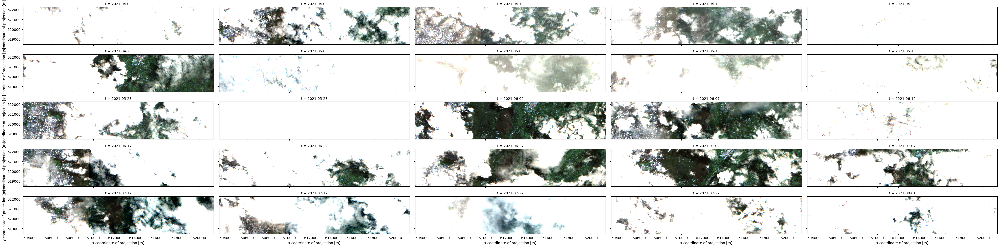

In [9]:
s2_cube_save = s2_cube.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_cube_save.send_job(title="S2L2A_cube")
results = my_job.start_and_wait().get_results()
results.download_files("S2L2A_cube")

ds_s2_cube = xr.open_dataset("S2L2A_cube/openEO.nc").load()
ds_s2_cube[['B02', 'B03', 'B04']].to_array().plot.imshow(x="x", robust=True, col ="t", col_wrap=5,vmin=0, vmax=3000, figsize=(40, 10));
 

*B) Mask Clouds, Shadows and Snow*


In [16]:
# This will avoid loading data from sentinelhub which is then discarded later on

s2_cube_masking = connection.load_collection(
    'SENTINEL2_L2A_SENTINELHUB',
    spatial_extent=spatial_extent,
    temporal_extent=[start_date_exclusion, end_date],
    bands=['CLP', 'SCL'])

# Scene classification data, based on Sen2Cor
# scl == 3    Cloud Shadows 
# scl == 8    Clouds medium probability
# scl == 9    Clouds high probability
# scl == 10   Cirrus
# scl == 11   Snow / Ice

scl = s2_cube_masking.band("SCL")
mask_scl = (scl == 3) | (scl == 8) | (scl == 9) | (scl == 10) | (scl == 11)


# CLP (cloud probabilities) based on S2cloudless (160 blocks and 10m resolution)
clp = s2_cube_masking.band("CLP")
mask_clp = mask_scl | (clp / 255) > 0.3

# mask {1 = cloud, 0 = free cloud}
s2_cube = s2_cube.mask(mask_clp.resample_cube_spatial(s2_cube))


- (Optional)  Download and Visualize of S2 scenes masked

<xarray.Dataset>
Dimensions:           (t: 23, x: 1800, y: 382)
Coordinates:
  * t                 (t) datetime64[ns] 2021-04-03 2021-04-08 ... 2021-08-01
  * x                 (x) float64 6.034e+05 6.034e+05 ... 6.213e+05 6.213e+05
  * y                 (y) float64 5.223e+05 5.223e+05 ... 5.185e+05 5.185e+05
Data variables:
    crs               |S1 ...
    B02               (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    B03               (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    B04               (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    B08               (t, y, x) float32 ...
    sunAzimuthAngles  (t, y, x) float32 ...
    sunZenithAngles   (t, y, x) float32 ...
Attributes:
    Conventions:  CF-1.9
    institution:  openEO platform - Geotrellis backend: 0.6.5a1
    description:  
    title:

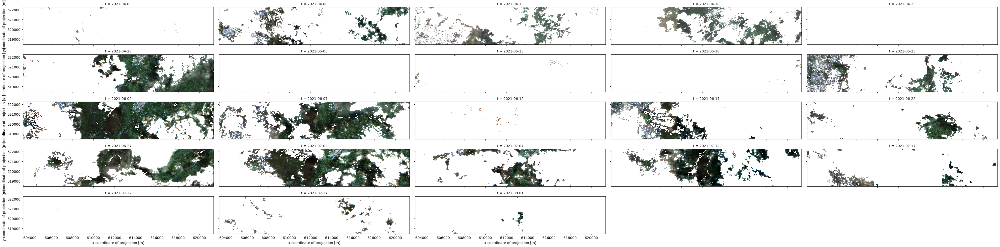

In [11]:
s2_cube_save = s2_cube.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_cube_save.send_job(title="s2_cube_cloudfree")
results = my_job.start_and_wait().get_results()
results.download_files("s2_cube_cloudfree") 
 
ds_s2_cube_masked = xr.open_dataset("s2_cube_cloudfree/openEO.nc")
ds_s2_cube_masked[['B02', 'B03', 'B04']].to_array().plot.imshow(x="x", robust=True, col ="t", col_wrap=5,vmin=0, vmax=3000, figsize=(40, 10)); 
ds_s2_cube_masked


*C) Mask Terrain Shadow*

In [12]:

dem_cube = connection.load_collection(
    "COPERNICUS_30",
    spatial_extent = spatial_extent,
    temporal_extent=["2010-01-01", "2030-12-31"])


dem_cube = dem_cube.max_time()

s2_cube = s2_cube.linear_scale_range(0,10000,0.0,1.0)
s2_cube = s2_cube.linear_scale_range(0.0,1.0,0.0,10000.0)
dem_cube = dem_cube.linear_scale_range(0,10000,0.0,1.0)
dem_cube = dem_cube.linear_scale_range(0.0,1.0,0.0,10000.0)
dem_cube = dem_cube.resample_cube_spatial(s2_cube)

merged_cube = s2_cube.merge_cubes(dem_cube)


In [13]:
udf_code = """

from openeo.udf import XarrayDataCube
from openeo.udf.debug import inspect
import numpy as np
from hillshade.hillshade import hillshade


def rasterize(azimuth, resolution=None):
    # Convert the azimuth into its components on the XY-plane. Depending on the value of the
    # azimuth either the x or the y component of the resulting vector is scaled to 1, so that
    # it can be used conveniently to walk a grid.

    azimuth = np.deg2rad(azimuth)
    xdir, ydir = np.sin(azimuth), np.cos(azimuth)

    if resolution is not None:
        xdir = xdir * resolution[0]
        ydir = ydir * resolution[1]

    slope = ydir / xdir
    if slope < 1. and slope > -1.:
        xdir = 1.
        ydir = slope
    else:
        xdir = 1. / slope
        ydir = 1.
    return xdir, ydir


def _run_shader(sun_zenith, sun_azimuth, elevation_model, resolution_x, resolution_y):

    azimuth = np.nanmean(sun_azimuth.astype(np.float32))
    zenith = np.nanmean(sun_zenith.astype(np.float32))
    resolution = (float(resolution_x), float(resolution_y))
    ray_xdir, ray_ydir = rasterize(azimuth, resolution)

    # Assume chunking is already done by Dask
    ystart = 0
    yend = elevation_model.shape[0]

    # Make sure inputs have the right data type
    zenith = float(zenith)
    ray = (float(ray_xdir), float(ray_ydir))
    shadow = hillshade(elevation_model.astype(np.float32),
                       resolution,
                       zenith,
                       ray,
                       ystart,
                       yend)
    shadow = shadow.reshape(sun_azimuth.shape)
    shadow[np.isnan(sun_azimuth)] = 255
    return shadow


def apply_datacube(cube: XarrayDataCube, context: dict) -> XarrayDataCube:
    in_xarray = cube.get_array()
    sun_zenith = in_xarray.sel({"bands": "sunZenithAngles"}).values.astype(np.float32)
    sun_azimuth = in_xarray.sel({"bands": "sunAzimuthAngles"}).values.astype(np.float32)
    elevation_model = in_xarray.sel({"bands": "DEM"}).values.astype(np.float32)
    res_y = in_xarray.coords["y"][int(len(in_xarray.coords["y"])/2)+1] - in_xarray.coords["y"][int(len(in_xarray.coords["y"])/2)]
    res_x = in_xarray.coords["x"][int(len(in_xarray.coords["x"])/2)+1] - in_xarray.coords["x"][int(len(in_xarray.coords["x"])/2)]

    shadow = _run_shader(sun_zenith, sun_azimuth, elevation_model, res_x, res_y)
    cube.get_array().values[0] = shadow
    return cube

"""

In [14]:
process = openeo.UDF(code=udf_code, runtime="Python", data={"from_parameter": "x"})

hillshaded = merged_cube.apply(process=process)
hillshaded = hillshaded.rename_labels("bands", ["hillshade_mask", "sunAzimuthAngles", "sunZenithAngles", "DEM"])

s2_cube = s2_cube.mask(hillshaded.filter_bands(['hillshade_mask']))

- (Optional) Download and Visualize: 
1) Terrain Shadow mask 
2) the DEM 
3) S2 cube with masked terrain shadow

In [48]:
hillshaded_save = hillshaded.save_result(format='netCDF') #GTiff #netCDF
my_job  = hillshaded_save.send_job(title="hillshaded")
results = my_job.start_and_wait().get_results()
results.download_files("hillshaded") 

ds_hillshad = xr.load_dataset("hillshaded/openEO.nc")
ds_hillshad

<xarray.Dataset>
Dimensions:           (t: 25, x: 1800, y: 382)
Coordinates:
  * t                 (t) datetime64[ns] 2021-04-03 2021-04-08 ... 2021-08-01
  * x                 (x) float64 6.034e+05 6.034e+05 ... 6.213e+05 6.213e+05
  * y                 (y) float64 5.223e+05 5.223e+05 ... 5.185e+05 5.185e+05
Data variables:
    crs               |S1 b''
    hillshade_mask    (t, y, x) float32 255.0 255.0 255.0 ... 255.0 255.0 255.0
    sunAzimuthAngles  (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    sunZenithAngles   (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    DEM               (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    Conventions:  CF-1.9
    institution:  openEO platform - Geotrellis backend: 0.6.5a1
    description:  
    title:

In [ ]:

dem_save = dem_cube.save_result(format='netCDF') #GTiff #netCDF
my_job  = dem_save.send_job(title="dem")
results = my_job.start_and_wait().get_results()
results.download_files("dem") 


ds_dem = xr.load_dataset("dem/openEO.nc")
ds_dem["DEM"].plot(vmin=0, vmax=4000, size = 5)

In [ ]:
s2_cube_hillshaded_save = s2_cube.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_cube_hillshaded_save.send_job(title="s2_cube_hillshaded")
results = my_job.start_and_wait().get_results()
results.download_files("s2_cube_hillshaded") 

ds_s2_cube_hillshaded = xr.load_dataset("s2_cube_hillshaded/openEO.nc")
ds_s2_cube_hillshaded["DEM"].plot(vmin=0, vmax=1, size = 5)

D) Get an image count (using B8) of all the non-masked areas

In [17]:
s2_count = s2_cube.filter_bands(bands=["B08"])
s2_count = s2_count.reduce_dimension(reducer=lambda data: data.count(), dimension="t")
s2_count = s2_count.rename_labels("bands", ["count"])

- (Optional) Download and Visualize

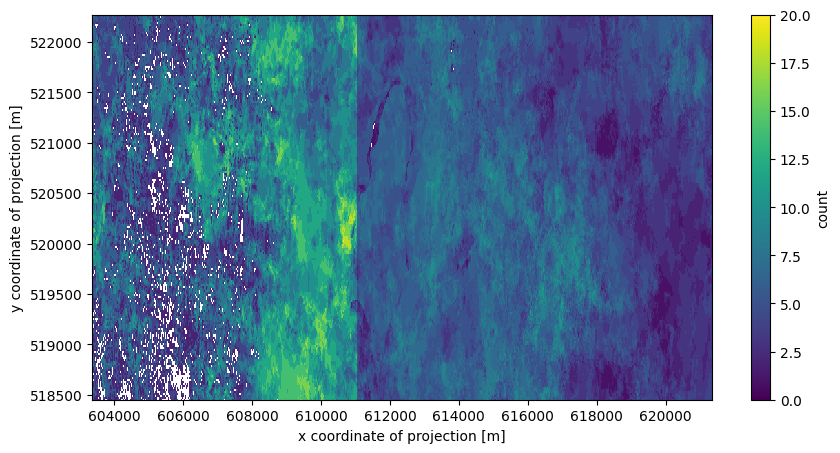

In [12]:

s2_count_save = s2_count.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_count_save.send_job(title="s2_count")
results = my_job.start_and_wait().get_results()
results.download_files("s2_count") 

ds_s2_count_cube = xr.open_dataset("s2_count/openEO.nc").load()
ds_s2_count_cube['count'].plot.imshow(x="x", robust=True, col_wrap=5,vmin=0, vmax=20, figsize=(10, 5)); #vmin=0, vmax=10,


D) NDVI and NDWI Calculation:
-   NDVI (Sentinel 2) = (B8 – B4) / (B8 + B4)
-   NDWI (Sentinel 2) = (B3 – B8) / (B3 + B8)

In [18]:
s2_cube = append_indices(s2_cube, ["NDWI","NDVI"]) 

- (Optional) Download and Visualize

<xarray.Dataset>
Dimensions:           (t: 25, x: 1800, y: 382)
Coordinates:
  * t                 (t) datetime64[ns] 2021-04-03 2021-04-08 ... 2021-08-01
  * x                 (x) float64 6.034e+05 6.034e+05 ... 6.213e+05 6.213e+05
  * y                 (y) float64 5.223e+05 5.223e+05 ... 5.185e+05 5.185e+05
Data variables:
    crs               |S1 b''
    B02               (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    B03               (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    B04               (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    B08               (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    sunAzimuthAngles  (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    sunZenithAngles   (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    NDWI              (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
    NDVI              (t, y, x) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    Conventions:  CF-1.9
    institution:  openEO platform - Geotrellis backend: 0.6.5a1
    description:  
    title:

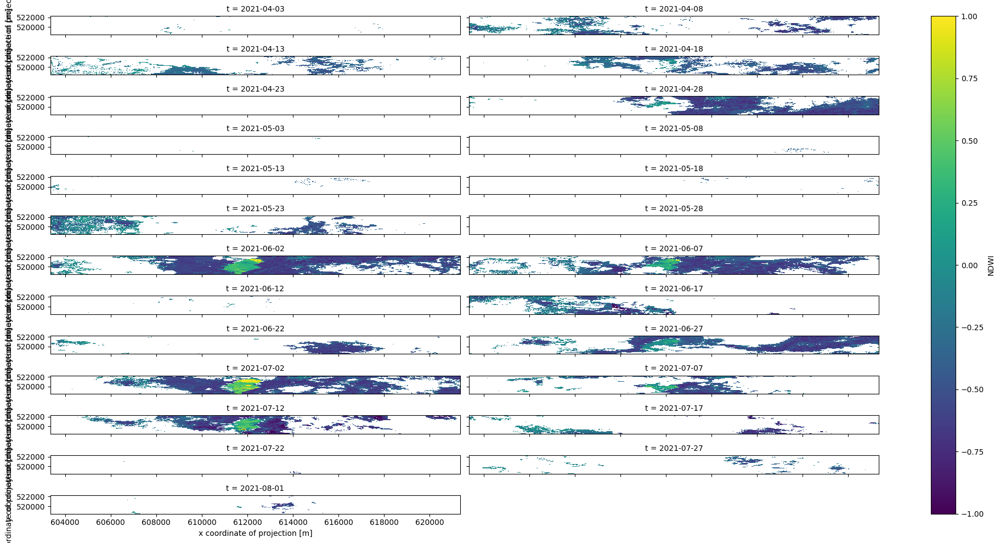

In [3]:

s2_cube.download("s2_cube_NDVI_NDWI.nc") 
s2_cube_save = s2_cube.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_cube_save.send_job(title="s2_cube_NDVI_NDWI")
results = my_job.start_and_wait().get_results()
results.download_files("s2_cube_NDVI_NDWI") 

ds_s2_cube_ndvi_ndwi = xr.open_dataset("s2_cube_NDVI_NDWI/openEO.nc").load()
# ds_s2_cube_ndvi_ndwi['NDVI'].plot.imshow(x="x", col = "t",  robust=True, col_wrap=2, vmin=-1, vmax=1, figsize=(20, 10)); 
ds_s2_cube_ndvi_ndwi['NDWI'].plot.imshow(x="x", col = "t", robust=True, col_wrap=2, vmin=-1, vmax=1, figsize=(20, 10)); 
ds_s2_cube_ndvi_ndwi

E) *Calculate water probability for each image (Of the non-masked data)*

In [22]:
def water_function(data):
    return LOOKUPTABLE[zone]["S2"](ndwi=data[6], ndvi=data[7])

s2_cube_water = s2_cube.reduce_dimension(reducer=water_function, dimension="bands")
s2_cube_water = s2_cube_water.add_dimension("bands", "water_prob", type="bands")

- (Optional) Download and Visualize

C:\Users\ansu\AppData\Local\Temp\ipykernel_28164\1268978691.py:2: DeprecationWarning: Call to deprecated method `send_job`, use `create_job` instead.
  my_job  = s2_cube_water_save.send_job(title="s2_cube_water")


0:00:00 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': send 'start'
0:00:32 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': queued (progress N/A)
0:00:37 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': queued (progress N/A)
0:00:43 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': queued (progress N/A)
0:00:51 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': queued (progress N/A)
0:01:01 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': queued (progress N/A)
0:01:13 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': queued (progress N/A)
0:01:29 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': queued (progress N/A)
0:01:48 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': queued (progress N/A)
0:02:12 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': running (progress N/A)
0:02:42 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': running (progress N/A)
0:03:19 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': running (progress N/A)
0:04:06 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': running (progress N/A)
0:05:04 Job 'j-0fa793ecc7be4bc78fc218e95f315d80': running (progress N

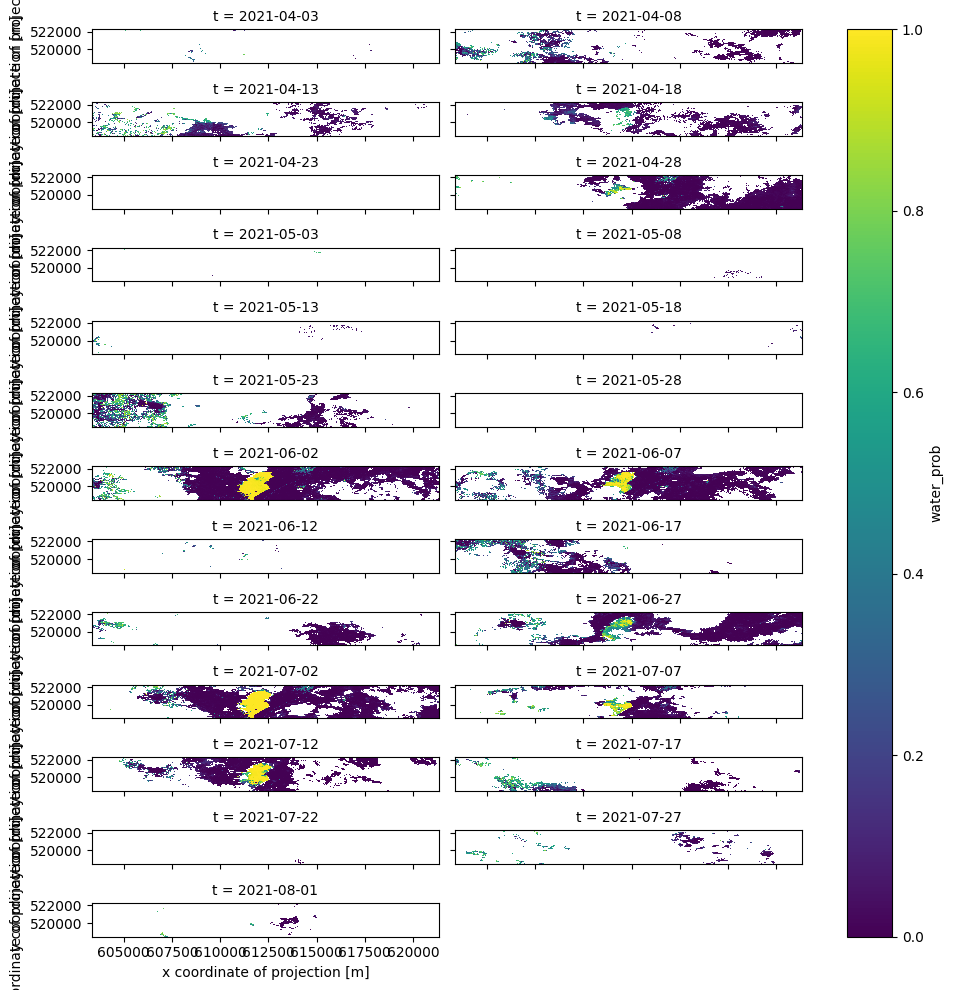

In [23]:
s2_cube_water_save = s2_cube_water.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_cube_water_save.send_job(title="s2_cube_water")
results = my_job.start_and_wait().get_results()
results.download_files("s2_cube_water") 

ds_s2_cube_water = xr.open_dataset("s2_cube_water/openEO.nc").load()
ds_s2_cube_water['water_prob'].plot.imshow(x="x", col = "t",  robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(10, 10)); 


- F) *Treshold of 75 on calculate water probability for each image*

In [ ]:

s2_cube_water_threshold = s2_cube_water.apply_dimension(dimension="bands", process=lambda x: if_(x > 0.75, x, 0))
s2_cube_water_threshold = s2_cube_water_threshold.rename_labels("bands", ["w_T75"])


- (Optional) Download and Visualize

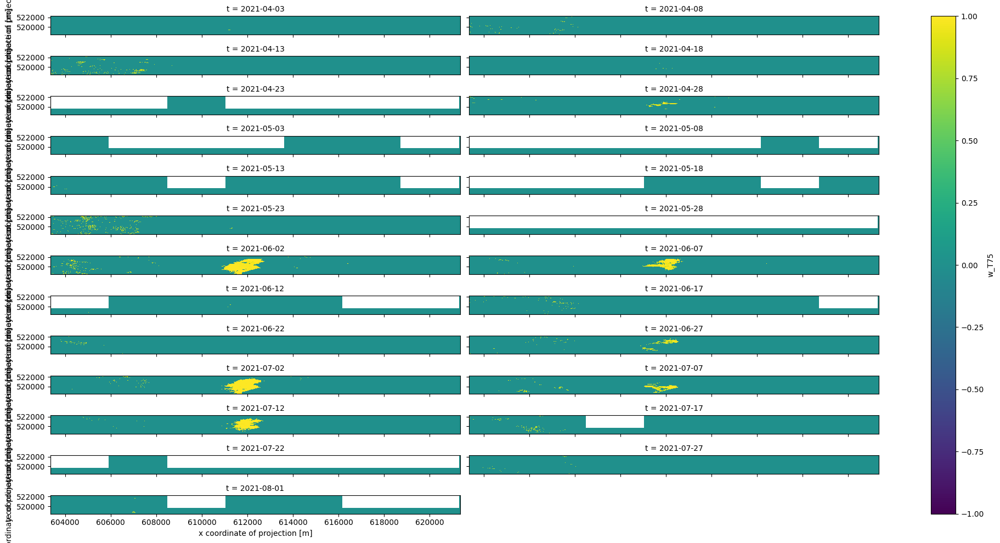

In [27]:
 
s2_cube_water_threshold_save = s2_cube_water_threshold.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_cube_water_threshold_save.send_job(title="s2_cube_water_threshold")
results = my_job.start_and_wait().get_results()
results.download_files("s2_cube_water_threshold")

ds_s2_cube_water_threshold = xr.open_dataset("s2_cube_water_threshold/openEO.nc").load()
ds_s2_cube_water_threshold
ds_s2_cube_water_threshold['w_T75'].plot.imshow(x="x", col = "t",  robust=True, col_wrap=2, vmin=-1, vmax=1, figsize=(20, 10)); 


G) *Count the number of Sentinel-2 Water observations*

In [ ]:
s2_cube_water_sum = s2_cube_water_threshold.reduce_dimension(reducer="sum", dimension="t")
s2_cube_water_sum = s2_cube_water_sum.rename_labels("bands", ["sum"])

- (Optional) Download and Visualize

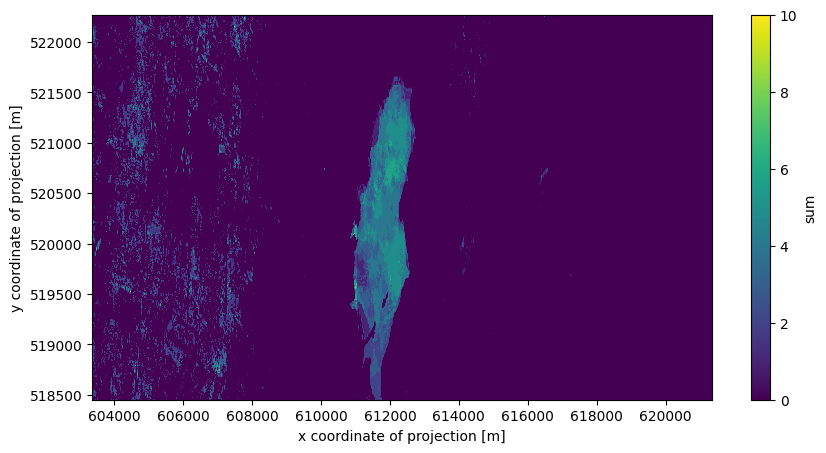

In [28]:
s2_cube_water_sum_save = s2_cube_water_sum.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_cube_water_sum_save.send_job(title="s2_cube_water_sum")
results = my_job.start_and_wait().get_results()
results.download_files("s2_cube_water_sum") 

ds_s2_cube_water_sum = xr.open_dataset("s2_cube_water_sum/openEO.nc").load()
ds_s2_cube_water_sum['sum'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=0, vmax=10, figsize=(10, 5));

J) *Calculate the surface water frequency*

In [ ]:

s2_cube_swf = s2_cube_water_sum.resample_cube_spatial(s2_count) / s2_count
s2_cube_swf = s2_cube_swf.rename_labels("bands", ["swf"])


- (Optional) Download and Visualize

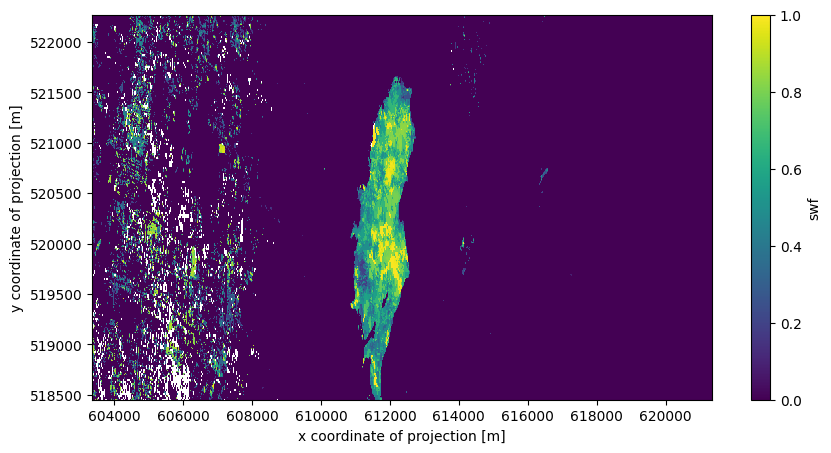

In [29]:

s2_cube_swf_save = s2_cube_swf.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_cube_swf_save.send_job(title="s2_cube_swf")
results = my_job.start_and_wait().get_results()
results.download_files("s2_cube_swf") 

ds_s2_cube_swf = xr.open_dataset("s2_cube_swf/openEO.nc").load()
ds_s2_cube_swf['swf'].plot.imshow(x="x",robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(10, 5)); 

E) *Create Monthly Best-Pixel Mosaic*

In [ ]:

## calculate the median s2 water probability for 1-month.
s2_median_water = s2_cube_water.filter_temporal([start_date, end_date]).median_time()


- (Optional) Download and Visualize

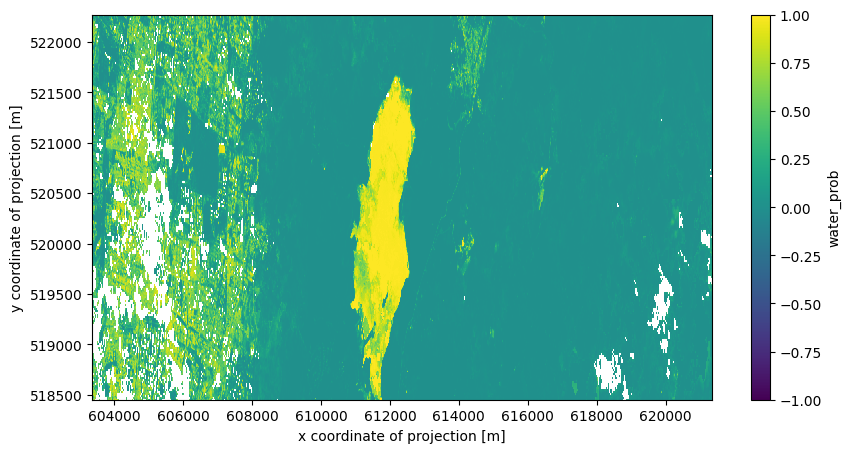

In [30]:
# Send cube to server
s2_median_water = s2_median_water.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_median_water.send_job(title="S2_L2A")
results = my_job.start_and_wait().get_results()
results.download_files("s2_median_water")

ds_s2_median_water = xr.open_dataset("s2_median_water/openEO.nc").load()
ds_s2_median_water
ds_s2_median_water['water_prob'].plot.imshow(x="x",robust=True, col_wrap=2, vmin=-1, vmax=1, figsize=(10, 5)); 


In [ ]:
s2_cube_median = s2_cube.filter_temporal([start_date, end_date]).median_time()

- (Optional) check the S2 median composite

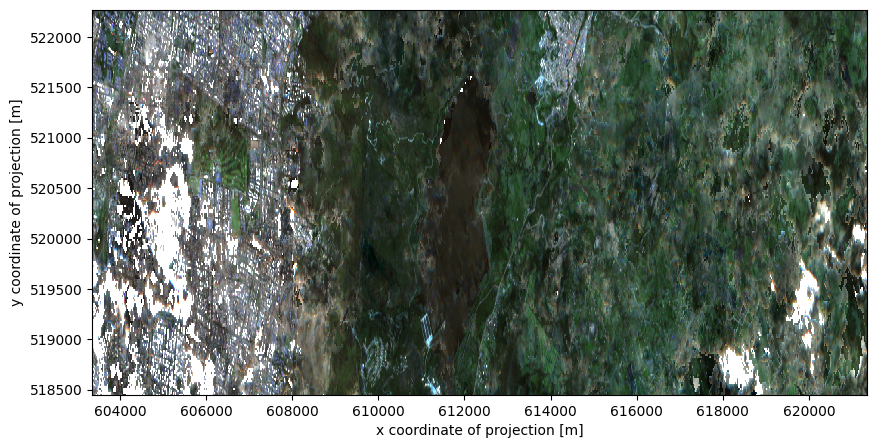

In [31]:

s2_cube_median_save = s2_cube_median.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_cube_median_save.send_job(title="s2_cube_median")
results = my_job.start_and_wait().get_results()
results.download_files("s2_cube_median")

ds_s2_median_water = xr.open_dataset("s2_cube_median/openEO.nc").load()
ds_s2_median_water[['B02', 'B03', 'B04']].to_array().plot.imshow(x="x", robust=True,  col_wrap=5,vmin=0, vmax=3000, figsize=(10, 5));
 

Check & download results: https://editor.openeo.org/

# 2) *Sentinel-1 ARD Pre-Processing*

Load Collection of Sentinel-1 

![Cat](../../images/S1_v2.png)

 Load Collection

In [ ]:

## Get Sentinel-1 data for a 1 month window and convert to ARD data.
s1_cube = connection.load_collection(
    'SENTINEL1_GRD',
    spatial_extent=spatial_extent,
    temporal_extent=[start_date, end_date],
    bands=['VH', 'VV'],
    properties={"polarization": lambda p: p == "DV"})
     

A) *Normalized Radar Backscatter*

*Terrain correction using COPERNICUS_30*

In [ ]:

s1_cube = s1_cube.sar_backscatter(coefficient="gamma0-terrain", mask=True, elevation_model="COPERNICUS_30")


B) *Mask Radar Shadow*

In [ ]:
s1_cube = s1_cube.rename_labels("bands", ["VH", "VV", "mask", "incidence_angle"])
s1_cube_mask = s1_cube.band("mask")


s1_mask_RS = (s1_cube_mask == 2)
s1_cube = s1_cube.mask(s1_mask_RS)

- (Optional) Download and Visualize of S1 images and mask

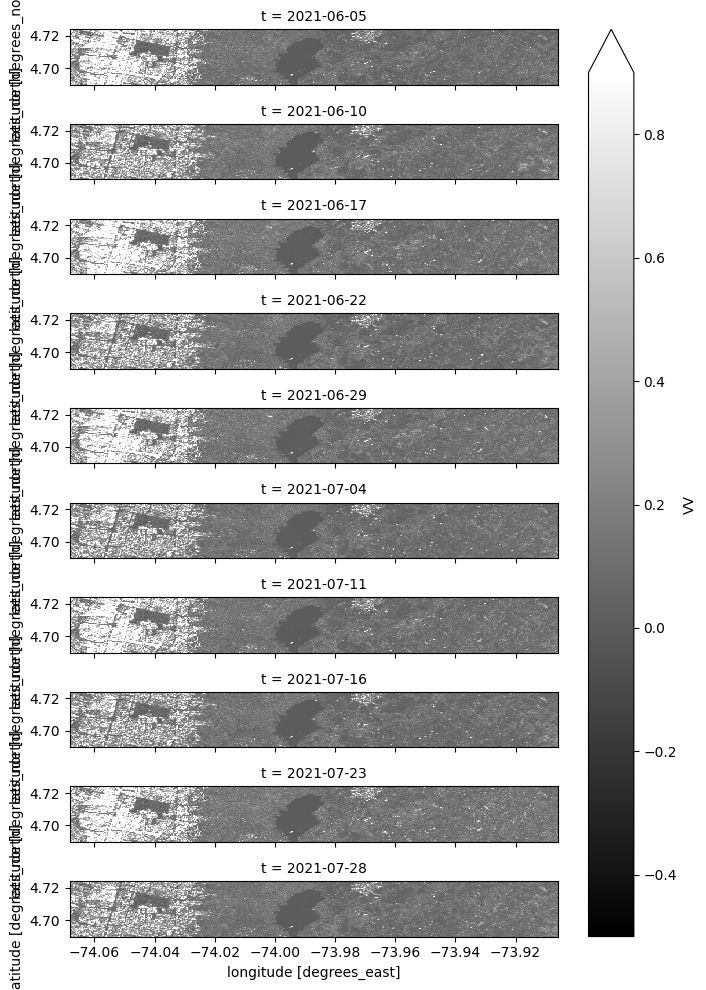

In [32]:
s1_cube_save = s1_cube.save_result(format='netCDF') #GTiff #netCDF
my_job  = s1_cube_save.create_job(title="s1_cube")
results = my_job.start_and_wait().get_results()
results.download_files('s1_cube')

# s1_cube.download("s1_cube_mask_RS.nc")
ds_s1_cube_masked = xr.open_dataset("s1_cube/openEO.nc").load()
ds_s1_cube_masked['VV'].plot.imshow(col="t", col_wrap=1, cmap= 'gray', figsize=(7, 10), vmin= -0.5, vmax= 0.9) 
#ds_s1_cube_masked['VH'].plot.imshow(col="t", col_wrap=1, cmap= 'gray', figsize=(7, 10), vmin= -0.9, vmax= 0.9)

- The final terrain-corrected values are converted to decibels via log scaling and calculation of median composite

In [ ]:
def log_(x):
    return 10 * log(x, 10)

s1_median = s1_cube.median_time().apply(log_)


- (Optional) Download and Visualize of S1 median image

<xarray.Dataset>
Dimensions:          (x: 945, y: 400)
Coordinates:
  * x                (x) float64 -74.07 -74.07 -74.07 ... -73.91 -73.91 -73.91
  * y                (y) float64 4.724 4.724 4.724 4.724 ... 4.69 4.69 4.69 4.69
Data variables:
    crs              |S1 b''
    VH               (y, x) float32 -12.34 -13.09 -11.7 ... -12.79 -12.9 -12.4
    VV               (y, x) float32 -3.945 -5.852 -5.966 ... -5.888 -5.555
    mask             (y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    incidence_angle  (y, x) float32 16.02 15.99 15.95 ... 16.32 16.45 16.48
Attributes:
    Conventions:  CF-1.9
    institution:  openEO platform - Geotrellis backend: 0.6.5a1
    description:  
    title:

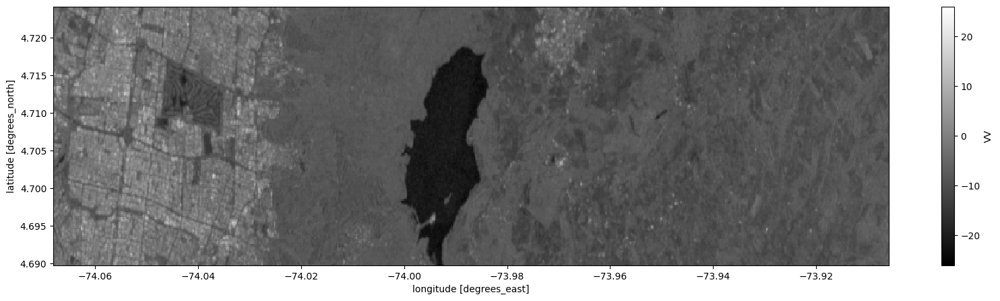

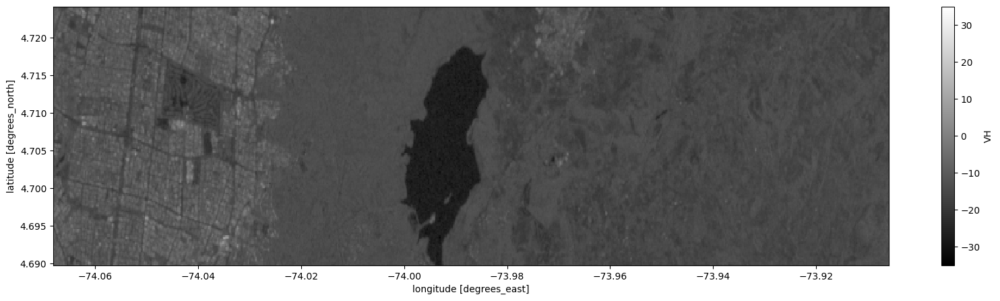

In [4]:
s1_cube_save = s1_median.save_result(format='netCDF') #GTiff #netCDF
my_job  = s1_cube_save.create_job(title="s1_median")
results = my_job.start_and_wait().get_results()
results.download_files('s1_median')

ds_s1_median = xr.open_dataset("s1_median/openeo.nc").load()
ds_s1_median['VV'].plot.imshow(col_wrap=1, cmap= 'gray', figsize=(20, 5)) 
ds_s1_median['VH'].plot.imshow(col_wrap=1, cmap= 'gray', figsize=(20, 5)) 
ds_s1_median

C) *Calculate water probability for the S1 composite*

In [ ]:
def s1_water_function(data):
    return LOOKUPTABLE[zone]["S1"](vh=data[0], vv=data[1])

s1_median_water = s1_median.reduce_dimension(reducer=s1_water_function, dimension="bands")


- (Optional) Download and Visualize 

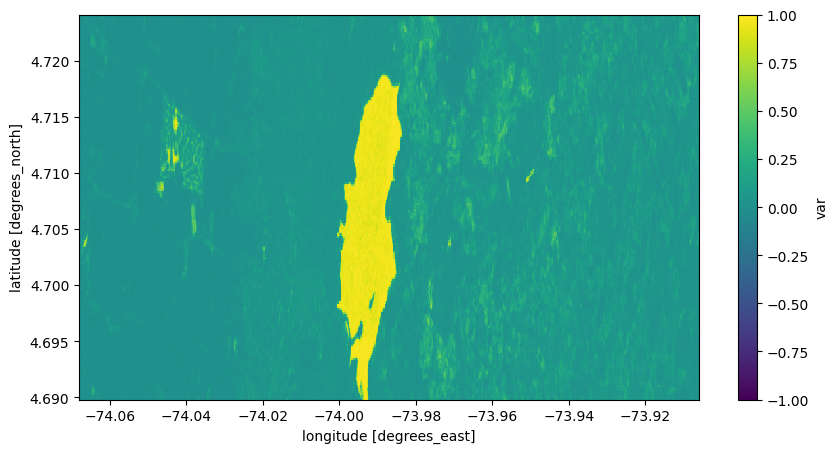

In [34]:
s1_cube_save = s1_median_water.save_result(format='netCDF') #GTiff #netCDF
my_job  = s1_cube_save.create_job(title="s1_median_water")
results = my_job.start_and_wait().get_results()
results.download_files('s1_median_water')

ds_s1_median_water = xr.open_dataset("s1_median_water/openeo.nc").load()
ds_s1_median_water
ds_s1_median_water['var'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=-1, vmax=1, figsize=(10, 5)); 

*D) Create an exclusion*

In [ ]:

exclusion_mask = (s1_median_water.resample_cube_spatial(s2_cube_swf) > 0.5) & (s2_cube_swf < 0.33)


- (Optional) Download and Visualize 

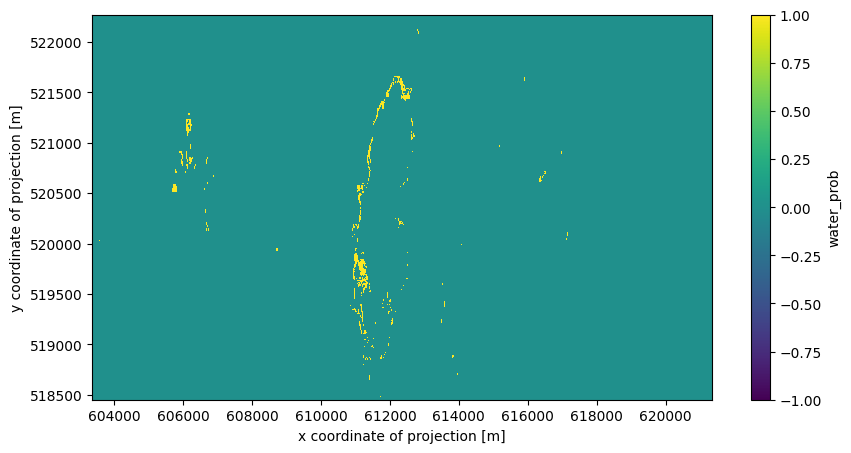

In [35]:
exclusion_mask_save = exclusion_mask.save_result(format='netCDF') #GTiff #netCDF
my_job  = exclusion_mask_save.create_job(title="exclusion_mask")
results = my_job.start_and_wait().get_results()
results.download_files('exclusion_mask')

ds_exclusion_mask = xr.open_dataset("exclusion_mask/openEO.nc").load()
ds_exclusion_mask
ds_exclusion_mask['water_prob'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=-1, vmax=1, figsize=(10, 5)); 


*E) Mask Sentinel-1 by the exlusion mask*

In [ ]:

s1_median_water_mask = s1_median_water.mask(exclusion_mask.resample_cube_spatial(s1_median_water))


- (Optional) Download and Visualize 

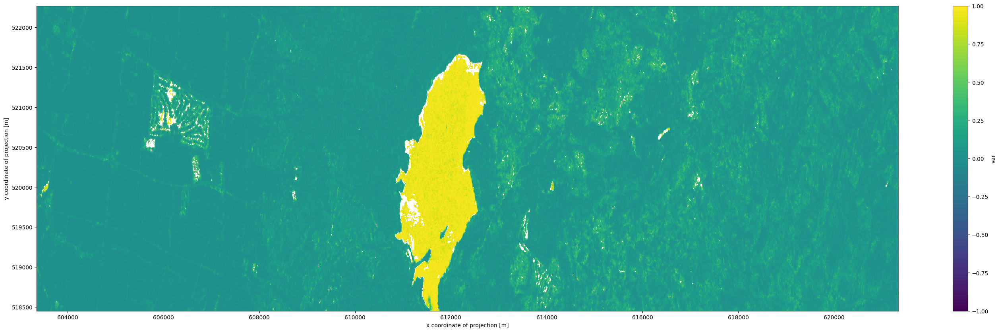

In [37]:


s1_median_water_mask_save = s1_median_water_mask.save_result(format='netCDF') #GTiff #netCDF
my_job  = s1_median_water_mask_save.send_job(title="s1_median_water_mask")
results = my_job.start_and_wait().get_results()
results.download_files('s1_median_water_mask')

ds_s1_median_water_mask = xr.open_dataset("s1_median_water_mask/openEO.nc").load()

ds_s1_median_water_mask['var'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=-1, vmax=1, figsize=(35, 10)); 


Check & download results: https://editor.openeo.org/

# 3) Water Masking

![WM_v1](../../images/WM_v1.png)

- A) Load LUT and run logistic expressions and mask with Exclusion mask

In [ ]:
def s1_s2_water_function(data):
    return LOOKUPTABLE[zone]["S1_S2"](vv=data[0], ndwi=data[1])

s1_s2_cube = s1_median.filter_bands(['VV']).resample_cube_spatial(s2_cube_median).merge_cubes(s2_cube_median.filter_bands(['NDWI'])) 
s1_s2_water = s1_s2_cube.reduce_dimension(reducer=s1_s2_water_function, dimension="bands").add_dimension("bands", "var", type="bands")
                      

- (Optional) Download and Visualize 

<xarray.Dataset>
Dimensions:  (x: 1800, y: 382)
Coordinates:
  * x        (x) float64 6.034e+05 6.034e+05 6.034e+05 ... 6.213e+05 6.213e+05
  * y        (y) float64 5.223e+05 5.223e+05 5.222e+05 ... 5.185e+05 5.185e+05
Data variables:
    crs      |S1 b''
    var      (y, x) float32 0.4167 0.5273 0.3534 ... 0.0215 0.0112 0.00248
Attributes:
    Conventions:  CF-1.9
    institution:  openEO platform - Geotrellis backend: 0.6.5a1
    description:  
    title:

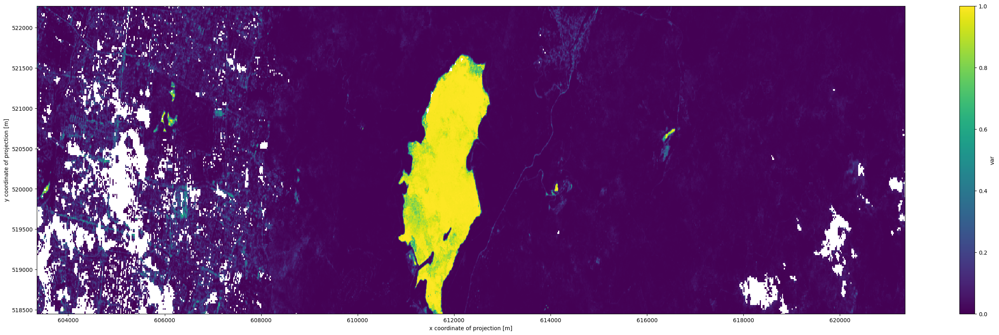

In [46]:
s1_s2_water_save = s1_s2_water.save_result(format='netCDF') #GTiff #netCDF
my_job  = s1_s2_water_save.send_job(title="s1_s2_water")
results = my_job.start_and_wait().get_results()
results.download_files('s1_s2_water')

ds_s1_s2_water_save = xr.open_dataset("s1_s2_water/openEO.nc").load()

ds_s1_s2_water_save['var'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(35, 10)); 
ds_s1_s2_water_save

- B) Create the masks so that the data is independent of each other

In [ ]:
## create the masks so that the data is independent of each other.
s1_s2_mask = (s1_s2_water >= 0)
s2_mask = s2_median_water.mask(s1_s2_mask) >= 0
s1_mask = s1_median_water.mask(s1_s2_mask).mask(s2_mask) >= 0

- (Optional) Download and Visualize 

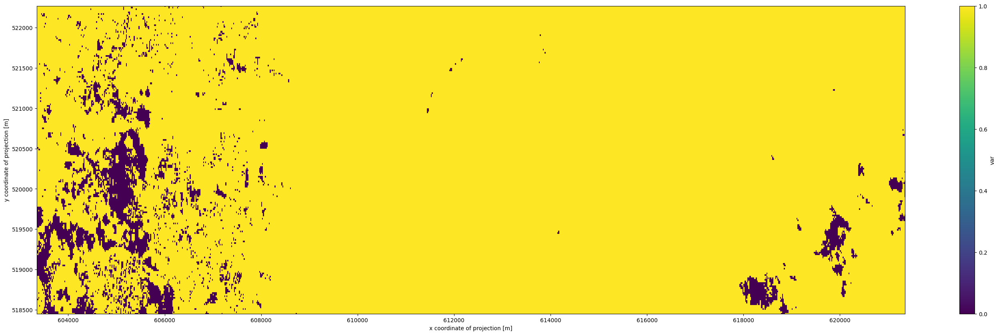

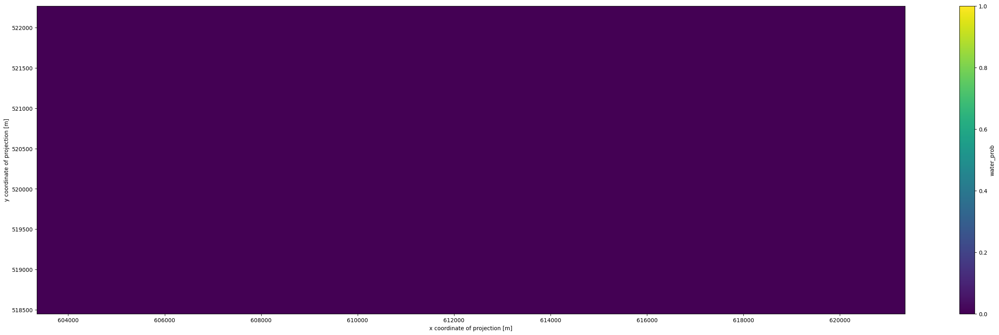

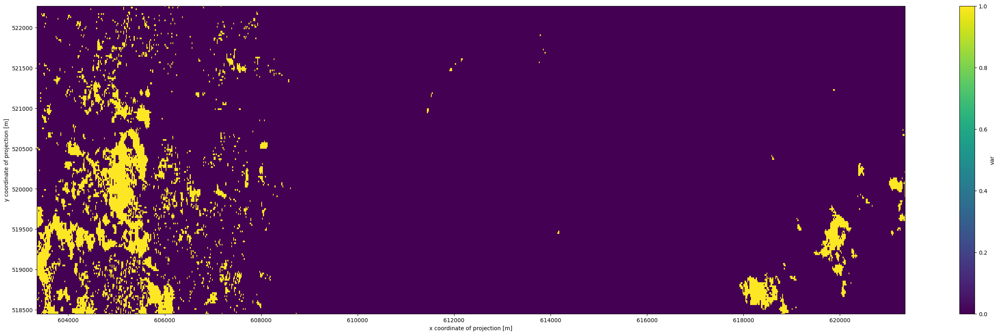

In [38]:

s1_s2_mask_save = s1_s2_mask.save_result(format='netCDF') #GTiff #netCDF
my_job  = s1_s2_mask_save.send_job(title="s1_s2_mask")
results = my_job.start_and_wait().get_results()
results.download_files('s1_s2_mask')

s2_mask_save = s2_mask.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_mask_save.send_job(title="s2_mask")
results = my_job.start_and_wait().get_results()
results.download_files('s2_mask')

s1_mask_save = s1_mask.save_result(format='netCDF') #GTiff #netCDF
my_job  = s1_mask_save.send_job(title="s1_mask")
results = my_job.start_and_wait().get_results()
results.download_files('s1_mask')

ds_s1_s2_mask = xr.open_dataset("s1_s2_mask/openEO.nc").load()
ds_s1_s2_mask['var'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(35, 10)); 
 
ds_s2_mask = xr.open_dataset("s2_mask/openEO.nc").load()
ds_s2_mask['water_prob'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(35, 10)); 

ds_s1_mask = xr.open_dataset("s1_mask/openEO.nc").load()
ds_s1_mask['var'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(35, 10)); 

C) Masks need to be inverted.

In [ ]:
s1_s2_masked = s1_s2_water.mask(s1_s2_mask.apply(lambda x: x.eq(0)), replacement = 0)
s2_masked = s2_median_water.mask(s2_mask.apply(lambda x: x.eq(0)), replacement = 0)
s1_masked = s1_median_water.mask(s1_mask.apply(lambda x: x.eq(0)), replacement = 0)

- (Optional) Download and Visualize 

In [ ]:
s1_s2_mask_save = s1_s2_masked.save_result(format='netCDF') #GTiff #netCDF
my_job  = s1_s2_masked.send_job(title="s1_s2_masked")
results = my_job.start_and_wait().get_results()
results.download_files('s1_s2_masked')

s2_masked_save = s2_masked.save_result(format='netCDF') #GTiff #netCDF
my_job  = s2_masked_save.send_job(title="s2_masked")
results = my_job.start_and_wait().get_results()
results.download_files('s2_masked')

s1_masked_save = s1_masked.save_result(format='netCDF') #GTiff #netCDF
my_job  = s1_masked_save.send_job(title="s1_masked")
results = my_job.start_and_wait().get_results()
results.download_files('s1_masked')

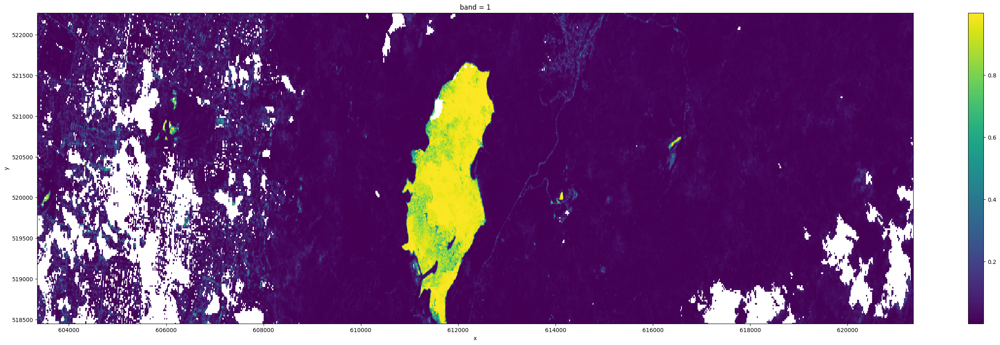

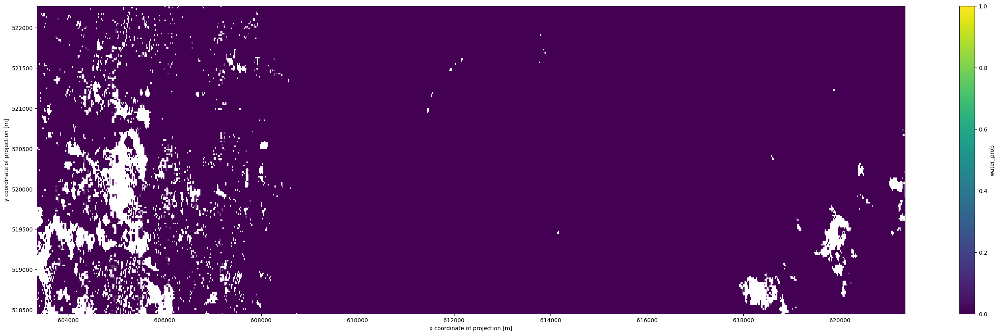

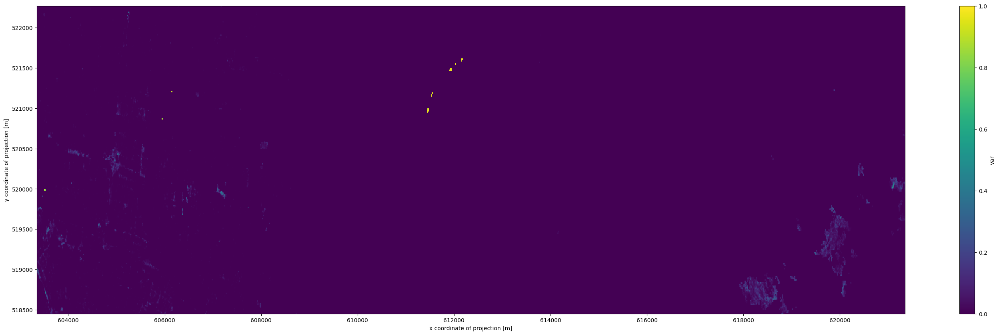

In [39]:
ds_s1_s2_masked = xr.open_rasterio("s1_s2_masked/openEO.tif")
ds_s1_s2_masked.plot(figsize=(35, 10))

ds_s2_masked = xr.open_dataset("s2_masked/openEO.nc").load()
ds_s2_masked['water_prob'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(35, 10)); 

ds_s1_masked = xr.open_dataset("s1_masked/openEO.nc").load()
ds_s1_masked['var'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(35, 10))


D)  Merge the masked probabilities using "sum"

In [ ]:

merge_all = s1_s2_masked.merge_cubes(s2_masked, overlap_resolver='sum').merge_cubes(s1_masked, overlap_resolver='sum')


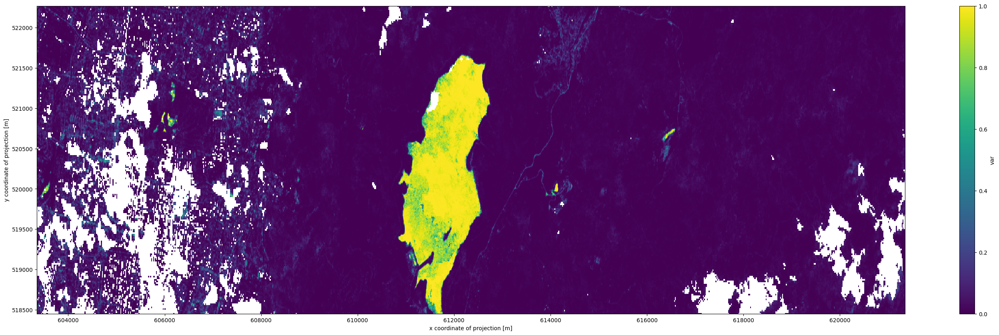

In [40]:
# merge_save = merge_all.save_result(format='netCDF') #GTiff #netCDF
# my_job  = merge_save.send_job(title="merge")
# results = my_job.start_and_wait().get_results()
# results.download_files('merge')

ds_merge = xr.open_dataset("merge/openEO.nc").load()
ds_merge
ds_merge['var'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(35, 10))

*D) Mask Urban Areas*

In [ ]:
worldcover_cube = connection.load_collection("ESA_WORLDCOVER_10M_2020_V1", 
                                            temporal_extent = ['2020-12-30', '2021-01-01'], 
                                            spatial_extent = spatial_extent, 
                                            bands = ["MAP"])
                                         
builtup_mask = worldcover_cube.band("MAP") == 50


water_probability = merge_all.mask(builtup_mask.max_time().resample_cube_spatial(merge_all))

- (Optional) Download and Visualize 

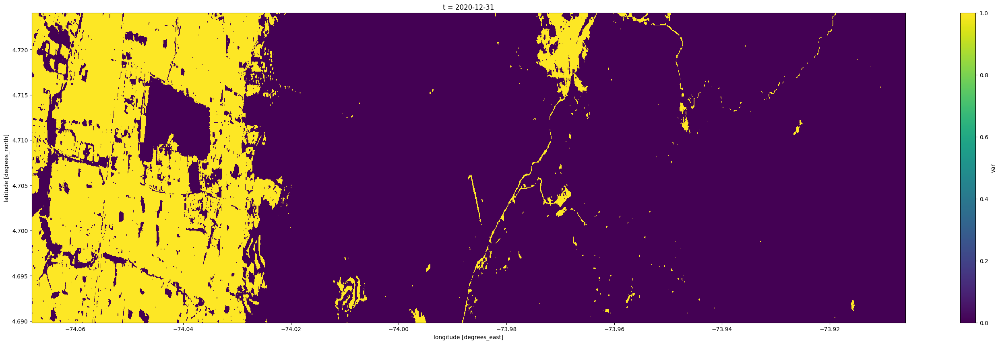

In [42]:
builtup_mask_save = builtup_mask.save_result(format='netCDF') #GTiff #netCDF
my_job  = builtup_mask_save.send_job(title="builtup_mask")
results = my_job.start_and_wait().get_results()
results.download_files('builtup_mask')

ds_builtup_mask = xr.open_dataset("builtup_mask/openEO.nc").load()
ds_builtup_mask['var'].plot(figsize=(35, 10))


In [ ]:
water_probability_save = water_probability.save_result(format='netCDF') #GTiff #netCDF
my_job  = water_probability_save.send_job(title="water_probability")
results = my_job.start_and_wait().get_results()
results.download_files('water_probability')

ds_water_probability = xr.open_dataset("water_probability/openEO.nc").load()
ds_water_probability['var'].plot(figsize=(35, 10))
ds_water_probability

*E) Threshold water prob*

In [ ]:

water_T75 = water_probability > 0.75


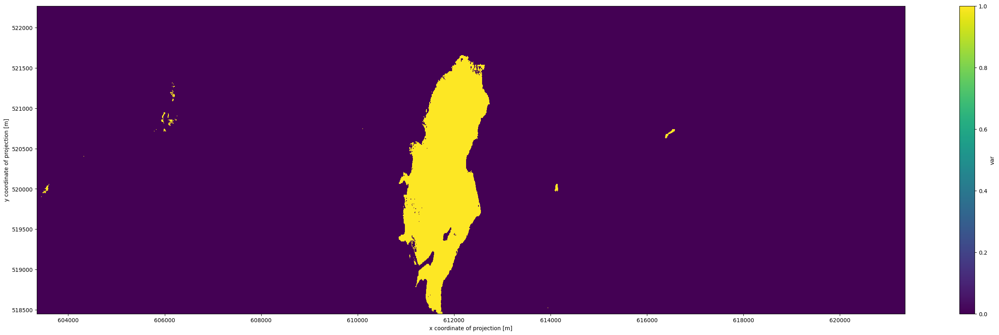

In [41]:
water_T75_save = water_T75.save_result(format='netCDF') #GTiff #netCDF
my_job  = water_T75_save.send_job(title="water_T75")
results = my_job.start_and_wait().get_results()
results.download_files('water_T75')

ds_water_T75 = xr.open_dataset("water_T75/openEO.nc").load()
ds_water_T75['var'].plot.imshow(x="x", robust=True, col_wrap=2, vmin=0, vmax=1, figsize=(35,10 )); 


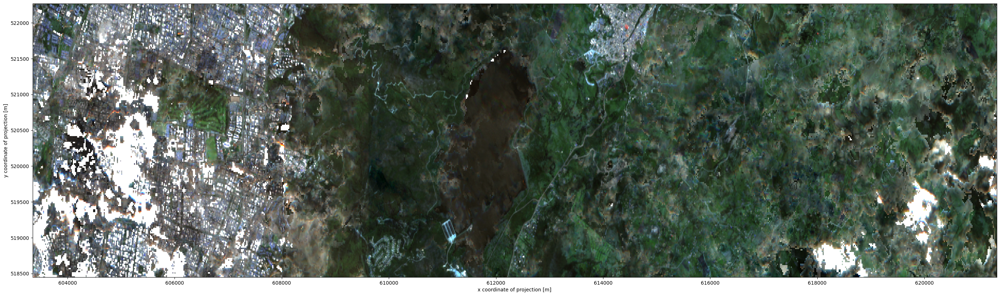

In [44]:
ds_s2_median_water = xr.open_dataset("s2_cube_median/openEO.nc").load()
ds_s2_median_water[['B02', 'B03', 'B04']].to_array().plot.imshow(x="x", robust=True,  col_wrap=5,vmin=0, vmax=3000, figsize=(35, 10));